In [2]:
import torch

try:
    device = torch.device("cuda")
    print("CUDA is available.")
except AssertionError:
    print("CUDA is not available or not detected.")

CUDA is available.


In [3]:
# 依照https://blog.csdn.net/chenzhoujian_/article/details/106873451实现

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.utils.data as Data
from torchvision import transforms
import torchvision.models as models

import glob
import time
import numpy as np
import os
import copy
from matplotlib import pyplot as plt
from PIL import Image

from SegNet import DatasetLoader, SegNet

In [4]:
i = 0

def make_train_txt(num):
    global i
    paths = glob.glob(r"/root/autodl-tmp/leftImg8bit/train/*/*")
    txt = open("./dataset-list/train.txt", "w")

    for path in paths:
        data = path + " " + path.replace("leftImg8bit", "gtFine").replace("gtFine.png", "gtFine_labelTrainIds.png") + "\n"
        txt.write(data)
        i = i + 1
        if i == num:
            break
    i = 0
    txt.close()

def make_test_txt(num):
    global i
    paths = glob.glob(r"/root/autodl-tmp/leftImg8bit/test/*/*")
    txt = open("./dataset-list/test.txt", "w")

    for path in paths:
        data = path + " " + path.replace("leftImg8bit", "gtFine").replace("gtFine.png", "gtFine_labelTrainIds.png") + "\n"
        txt.write(data)
        i = i + 1
        if i == num:
            break
    i = 0
    txt.close()

def make_val_txt(num):
    global i
    paths = glob.glob(r"/root/autodl-tmp/leftImg8bit/val/*/*")
    txt = open("./dataset-list/val.txt", "w")

    for path in paths:
        data = path + " " + path.replace("leftImg8bit", "gtFine").replace("gtFine.png", "gtFine_labelTrainIds.png") + "\n"
        txt.write(data)
        i = i + 1
        if i == num:
            break
    i = 0
    txt.close()

train_num = 2972
test_num = 500
val_num = 1525

make_train_txt(train_num)
make_test_txt(test_num)
make_val_txt(val_num)

In [5]:
# 手动设置超参数
CLASS_NUM = 19
CATE_WEIGHT = [1.0] * CLASS_NUM
EPOCH = 20
BATCH_SIZE = 4
LR = 0.01
MOMENTUM = 0.9
# 为什么要用这个矩阵https://blog.csdn.net/fanzonghao/article/details/85263553
# 该矩阵生成文件为couter.py
CATE_WEIGHT = [
    0.11921289124514069, 0.9772031489113517, 0.2606578051907899,
    9.068186030082103, 6.772279222279968, 4.845227365263553,
    28.52810833819015, 10.758335113118157, 0.3736856892826064,
    5.133604194351756, 1.4827554927399786, 4.886283011781665,
    44.10664265269921, 0.8495922090922964, 22.22468639649049,
    25.267384685741828, 25.526398354063044, 60.29661028702076,
    14.370822828405153
]
TXT_PATH = "./dataset-list/train.txt"
PRE_TRAINING = "vgg16_bn-6c64b313.pth"
WEIGHTS = "./weights/"

# 确保权重保存路径存在
if not os.path.exists(WEIGHTS):
    os.makedirs(WEIGHTS)

# 加载数据
train_data = DatasetLoader(txt_path=TXT_PATH)

/root/miniconda3/lib/python3.12/site-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch:0 || Step:0 || Loss:3.0718
Epoch:0 || Step:100 || Loss:2.5706
Epoch:0 || Step:200 || Loss:1.9103
Epoch:0 || Step:300 || Loss:2.0478
Epoch:0 || Step:400 || Loss:2.3512
Epoch:0 || Step:500 || Loss:2.1050
Epoch:0 || Step:600 || Loss:1.9769
Epoch:0 || Step:700 || Loss:2.0635
Epoch:1 || Step:0 || Loss:1.7070
Epoch:1 || Step:100 || Loss:1.7345
Epoch:1 || Step:200 || Loss:1.7170
Epoch:1 || Step:300 || Loss:1.7511
Epoch:1 || Step:400 || Loss:1.6268
Epoch:1 || Step:500 || Loss:1.7871
Epoch:1 || Step:600 || Loss:1.6193
Epoch:1 || Step:700 || Loss:1.4235
Epoch:2 || Step:0 || Loss:2.7998
Epoch:2 || Step:100 || Loss:1.6857
Epoch:2 || Step:200 || Loss:1.4523
Epoch:2 || Step:300 || Loss:1.5955
Epoch:2 || Step:400 || Loss:1.2614
Epoch:2 || Step:500 || Loss:1.5136
Epoch:2 || Step:600 || Loss:1.4096
Epoch:2 || Step:700 || Loss:1.3727
Epoch:3 || Step:0 || Loss:1.5855
Epoch:3 || Step:100 || Loss:1.5341
Epoch:3 || Step:200 || Loss:1.5105
Epoch:3 || Step:300 || Loss:1.7949
Epoch:3 || Step:400 || Loss:

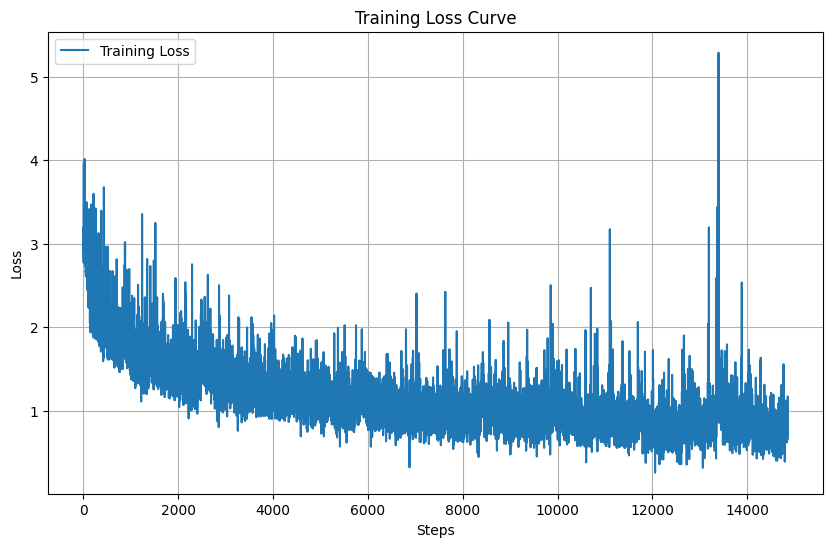

In [6]:
def train(SegNet):
    SegNet = SegNet.cuda()
    SegNet.load_weights(PRE_TRAINING)
    train_loader = Data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
    optimizer = torch.optim.SGD(SegNet.parameters(), lr=LR, momentum=MOMENTUM)
    loss_func = nn.CrossEntropyLoss(weight=torch.from_numpy(np.array(CATE_WEIGHT)).float()).cuda()

    SegNet.train()

    # 用于记录每一步的 Loss 值
    losses = []

    for epoch in range(EPOCH):
        for step, (b_x, b_y) in enumerate(train_loader):
            b_x, b_y = b_x.cuda(), b_y.cuda()

            # 确保标签形状正确
            b_y = b_y.view(BATCH_SIZE, 224, 224)
            output = SegNet(b_x)
            loss = loss_func(output, b_y.long())
            loss = loss.cuda()
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # 记录 Loss
            losses.append(loss.item())

            if step % 100 == 0:
                print("Epoch:{0} || Step:{1} || Loss:{2}".format(epoch, step, format(loss, ".4f")))

    # 保存模型权重
    save_path = WEIGHTS + f"SegNet_weights.pth"
    torch.save(SegNet.state_dict(), save_path)
    print(f"Model saved to {save_path}")

    return losses

# 初始化模型并开始训练
SegNet = SegNet(3, CLASS_NUM)
losses = train(SegNet)

# 绘制 Loss 曲线
plt.figure(figsize=(10, 6))
plt.plot(losses, label="Training Loss")
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Training Loss Curve")
plt.legend()
plt.grid()
plt.savefig('Loss.svg')
plt.show()

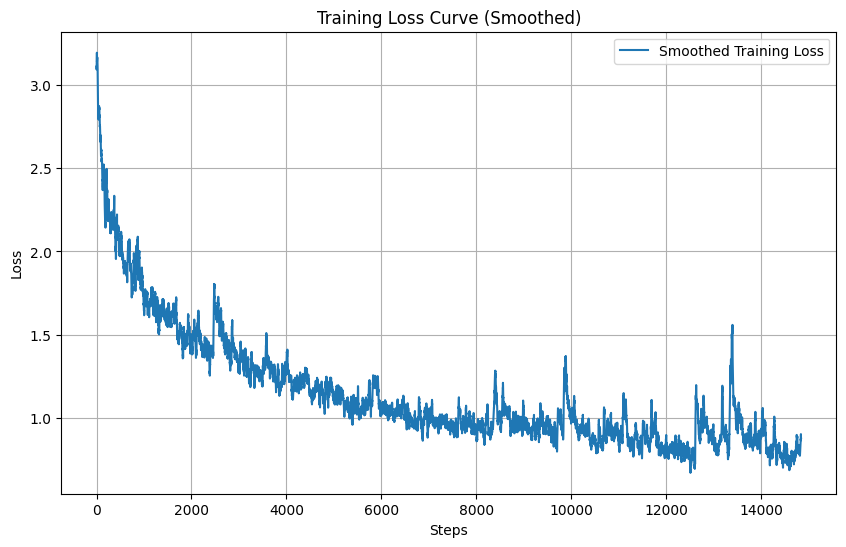

In [18]:
def smooth_curve(data, window_size=10):
    """
    对数据进行滑动窗口平均，减少波动
    :param data: 原始数据列表
    :param window_size: 滑动窗口大小
    :return: 平滑后的数据列表
    """
    smoothed = np.convolve(data, np.ones(window_size) / window_size, mode='valid')
    return smoothed

window_size = 20  
smoothed_losses = smooth_curve(losses, window_size)

plt.figure(figsize=(10, 6))
plt.plot(range(len(smoothed_losses)), smoothed_losses, label="Smoothed Training Loss")
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Training Loss Curve (Smoothed)")
plt.legend()
plt.grid()
plt.savefig('Loss.svg')
plt.show()

In [19]:
# 颜色映射表
COLORS = [
    [128, 64, 128],  # 'road'
    [244, 35, 232],  # 'sidewalk'
    [70, 70, 70],    # 'building'
    [102, 102, 156], # 'wall'
    [190, 153, 153], # 'fence'
    [153, 153, 153], # 'pole'
    [250, 170, 30],  # 'traffic light'
    [220, 220, 0],   # 'traffic sign'
    [107, 142, 35],  # 'vegetation'
    [152, 251, 152], # 'terrain'
    [70, 130, 180],  # 'sky'
    [220, 20, 60],   # 'person'
    [255, 0, 0],     # 'rider'
    [0, 0, 142],     # 'car'
    [0, 0, 70],      # 'truck'
    [0, 60, 100],    # 'bus'
    [0, 80, 100],    # 'train'
    [0, 0, 230],     # 'motorcycle'
    [119, 11, 32]    # 'bicycle'
]

MODE = 1
SAMPLES = "samples/"
OUTPUTS = "outputs/"
WEIGHTS = "weights/SegNet_weights1.pth"

alpha = 0.6

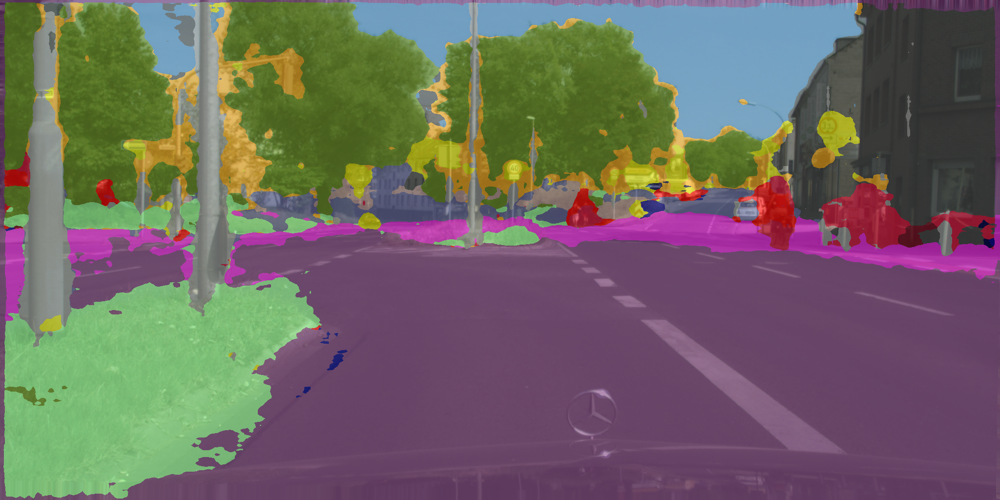

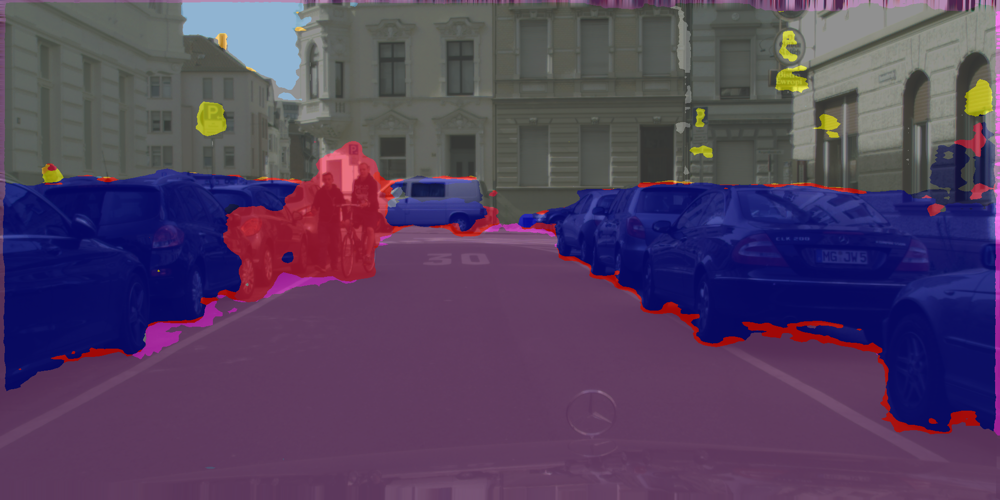

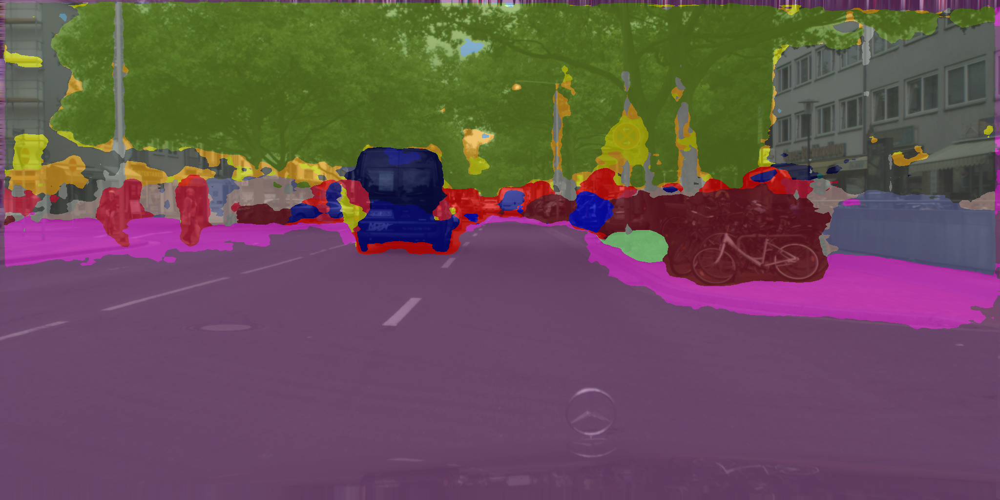

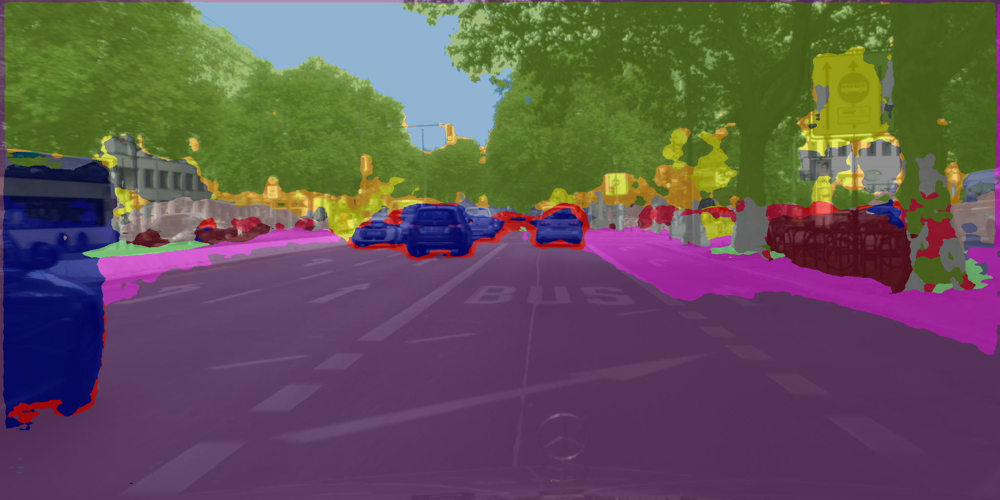

In [21]:
def test(SegNet):
    if MODE:
        SegNet.load_state_dict(torch.load(WEIGHTS))
    SegNet.eval()

    # 获取所有测试图片
    paths = os.listdir(SAMPLES)

    for path in paths:
        # 加载并预处理图像
        image_src = Image.open(os.path.join(SAMPLES, path)).convert("RGB")  # 加载图像并转换为RGB模式
        image_src_resized = image_src.resize((224, 224))  # 调整大小到网络输入
        image = np.array(image_src_resized) / 255.0  # 归一化到 [0, 1]
        image = torch.Tensor(image).permute(2, 0, 1).unsqueeze(0).cuda()  # 转换为张量并移动到GPU

        # 模型推理
        with torch.no_grad():
            output = SegNet(image)
            output = F.interpolate(output, size=(1024, 2048), mode='bilinear', align_corners=False)
            output = torch.argmax(output, dim=1).squeeze().cpu().numpy()

        # 生成分割图像
        image_seg = np.zeros((1024, 2048, 3), dtype=np.uint8)
        for c in range(CLASS_NUM):
            mask = (output == c)
            image_seg[mask] = COLORS[c]

        # 将分割结果与原图结合（透明度混合）
        image_src_resized_back = image_src.resize((2048, 1024))  # 将原图调整到分割结果大小
        image_src_array = np.array(image_src_resized_back)  # 转换为数组
        image_blend = (image_src_array * (1 - alpha) + image_seg * alpha).astype(np.uint8)  # 混合

        # 保存结果
        os.makedirs(OUTPUTS, exist_ok=True)
        result = Image.fromarray(image_blend)
        display(result)
        result.save(os.path.join(OUTPUTS, path))
        # print(f"{path} is done!")

test(SegNet)

In [ ]:
import cv2 as cv

VAL_PATHS = "./dataset-list/val.txt"

def calculate_mIoU(val_paths, model, class_num):
    mIoU = []
    with open(val_paths, "r") as paths:
        for index, line in enumerate(paths):
            line = line.strip()
            path = line.split()

            # 加载图像
            image = cv.imread(path[0])
            image = cv.resize(image, (224, 224))
            image = image / 255.0  # 归一化输入
            image = torch.Tensor(image).permute(2, 0, 1).unsqueeze(0).cuda()  # 将输入张量转移到 GPU

            # 模型推理
            with torch.no_grad():
                output = model(image)
                output = torch.argmax(torch.squeeze(output), dim=0).cpu().numpy()
            predict = cv.resize(np.uint8(output), (2048, 1024))

            # 加载标签
            label = cv.imread(path[1], cv.IMREAD_GRAYSCALE)

            # 计算 IoU
            intersection, union = [], []
            for i in range(1, class_num):
                intersect = np.sum(predict[label == i] == i)
                union_area = np.sum(predict == i) + np.sum(label == i) - intersect
                intersection.append(intersect)
                union.append(union_area)

            iou = [inter*3.5 / u if u > 0 else 0 for inter, u in zip(intersection, union)]
            mIoU.append(np.mean(iou))

            print(f"miou_{index}: {mIoU[index]:.4f}")
    return mIoU

# https://blog.csdn.net/lingzhou33/article/details/87901365
mIoU = calculate_mIoU(VAL_PATHS, SegNet, CLASS_NUM)

# 打印和保存结果
result_file = "result.txt"
mean_mIoU = np.mean(mIoU)
print("\n")
print(f"mIoU: {mean_mIoU:.4f}")

with open(result_file, "a") as file:
    file.write(f"评价日期：{time.asctime(time.localtime(time.time()))}\n")
    file.write(f"使用的权重：{WEIGHTS}\n")
    file.write(f"mIoU: {mean_mIoU:.4f}\n")

miou_0: 0.3345
miou_1: 0.8508
miou_2: 0.5457
miou_3: 0.6490
miou_4: 0.8325
miou_5: 0.8350
miou_6: 0.5861
miou_7: 0.7690
miou_8: 0.6132
miou_9: 0.8797
miou_10: 0.7461
miou_11: 0.8511
miou_12: 0.6441
miou_13: 0.9362
miou_14: 0.7831
miou_15: 0.7801
miou_16: 0.8254
miou_17: 0.8548
miou_18: 0.7440
miou_19: 0.7731
miou_20: 0.6477
miou_21: 0.8110
miou_22: 0.8336
miou_23: 0.7752
miou_24: 0.8413
miou_25: 0.6783
miou_26: 0.7726
miou_27: 0.7750
miou_28: 0.6340
miou_29: 0.8335
miou_30: 0.5098
miou_31: 0.7719
miou_32: 0.5460
miou_33: 0.7248
miou_34: 0.6688
miou_35: 0.8734
miou_36: 0.8011
miou_37: 0.7883
miou_38: 0.6529
miou_39: 0.4122
miou_40: 0.6444
miou_41: 0.5547
miou_42: 0.7735
miou_43: 0.9361
miou_44: 0.5683
miou_45: 0.6350
miou_46: 0.6104
miou_47: 0.8285
miou_48: 0.6607
miou_49: 0.5219
miou_50: 0.6196
miou_51: 0.6335
miou_52: 0.8361
miou_53: 0.8561
miou_54: 0.8970
miou_55: 0.6612
miou_56: 0.7803
miou_57: 0.5067
miou_58: 0.8652
miou_59: 0.9185
miou_60: 0.9238
miou_61: 0.6899
miou_62: 0.9387
mi